<a href="https://colab.research.google.com/github/Vinaypatil-Ev/vinEvPy-GoCoLab/blob/main/PracPaper2_PIL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PIL


In [1]:
from PIL import Image

In [106]:
from google.colab.patches import cv2_imshow
import cv2
def imshow(path:str, by="cv"):
    if by == "cv":
        im = cv2.imread(path)
        cv2_imshow(im)
    elif by == "pil":
        if isinstance(path, PIL.JpegImagePlugin.JpegImageFile):
            return path
        im = Image.open(path)
        return im
        

## Open Image

In [104]:
im_path = "2.jpg"
im = Image.open(im_path)

In [105]:
type(im)

PIL.JpegImagePlugin.JpegImageFile

In [ ]:
print(im)

In [3]:
im.format

'JPEG'

In [4]:
im.size

(694, 997)

In [5]:
im.mode

'RGB'

In [ ]:
show_img(im_path, "pil")

## Create thumbnail

In [29]:
size = (128, 128)
im.thumbnail(size)
im.save("thumb1.jpg", "JPEG")

In [30]:
im2  = Image.open("thumb1.jpg")
im2.size

(89, 128)

In [31]:
print(f"{im2.size}x{im2.mode}")

(89, 128)xRGB


## Cutting 
## Pasting
## Merging

### Croping subrectangle from image

In [39]:
box = (100, 100, 400, 400)
region = im.crop(box)

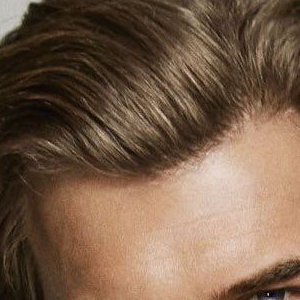

In [40]:
region

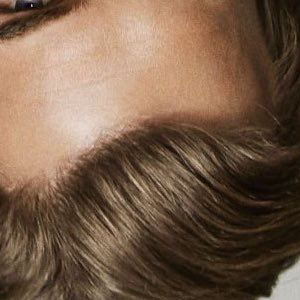

In [42]:
region = region.transpose(Image.ROTATE_180)
region

In [43]:
im.paste(region, box)

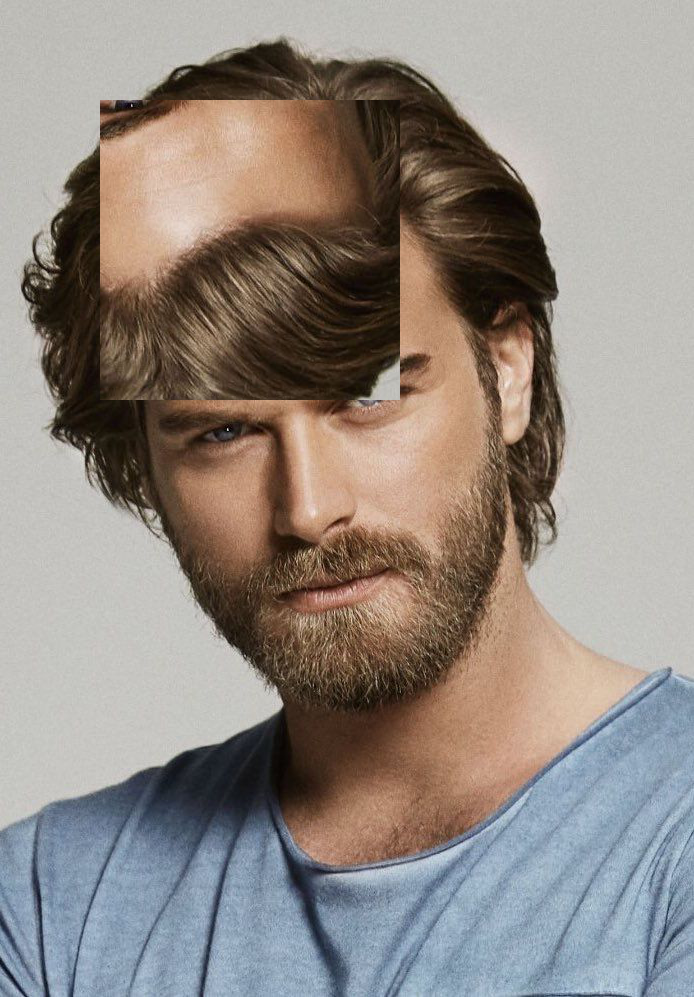

In [44]:
im

## Rolling an Image

In [46]:
def roll(img, delta):
    x, y = img.size
    delta %= x
    if delta == 0:
        return img
    
    p1 = img.crop((0, 0, delta, y))
    p2 = img.crop((delta, 0, x, y))
    img.paste(p1, (x-delta, 0, x, y))
    img.paste(p2, (0, 0, x-delta, y))
    return img

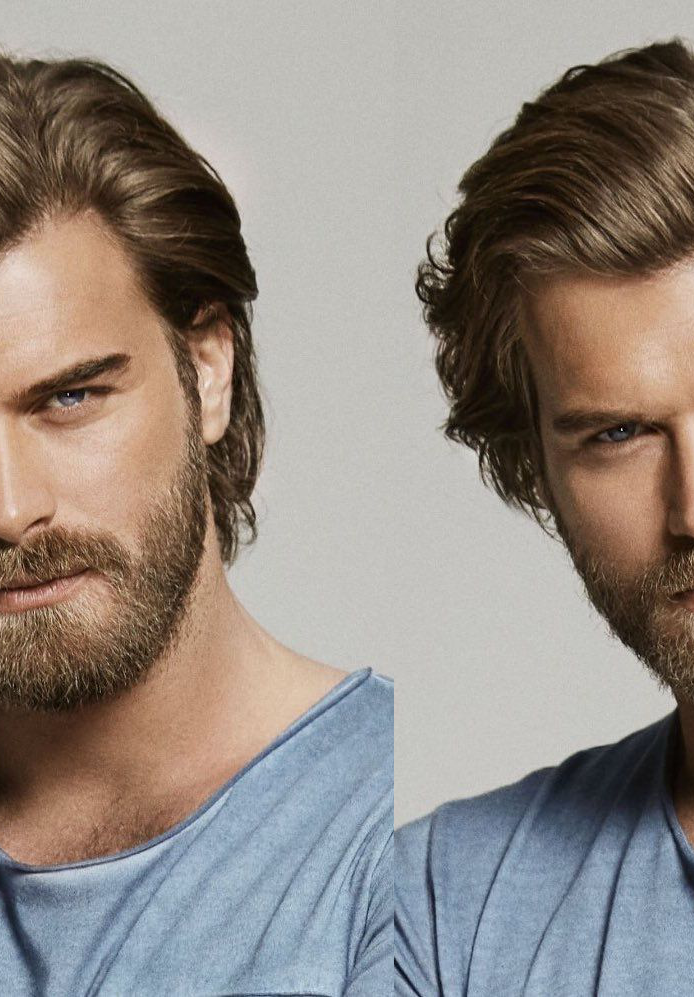

In [49]:
roll(Image.open(im_path), 300)

## Spliting and merging bands

In [50]:
im = Image.open(im_path)

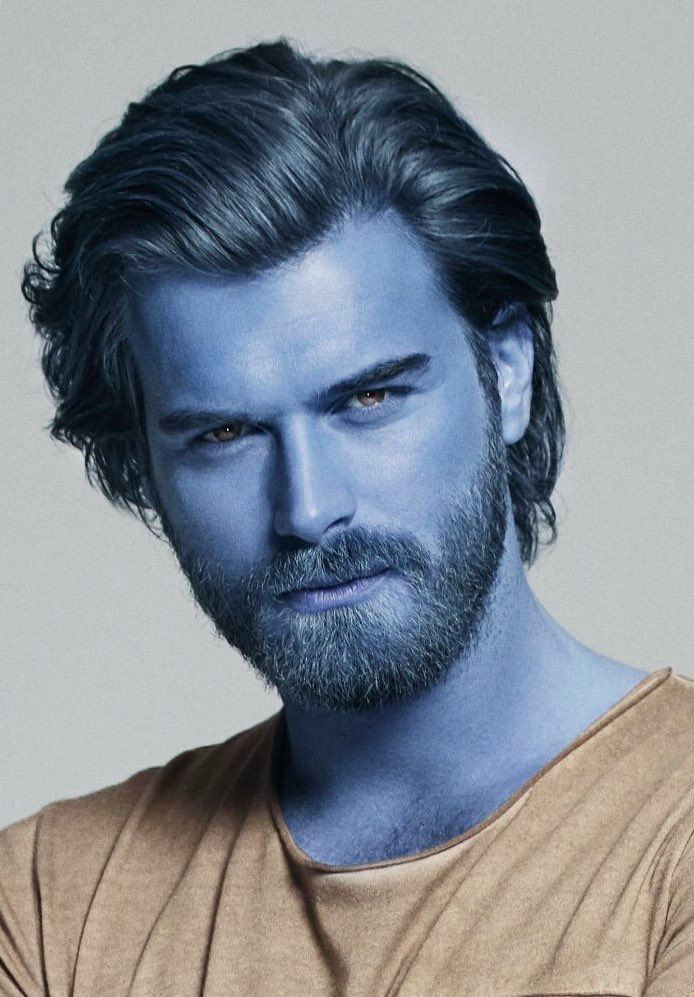

In [51]:
r, g, b = im.split()
Image.merge("RGB", (b, g, r))

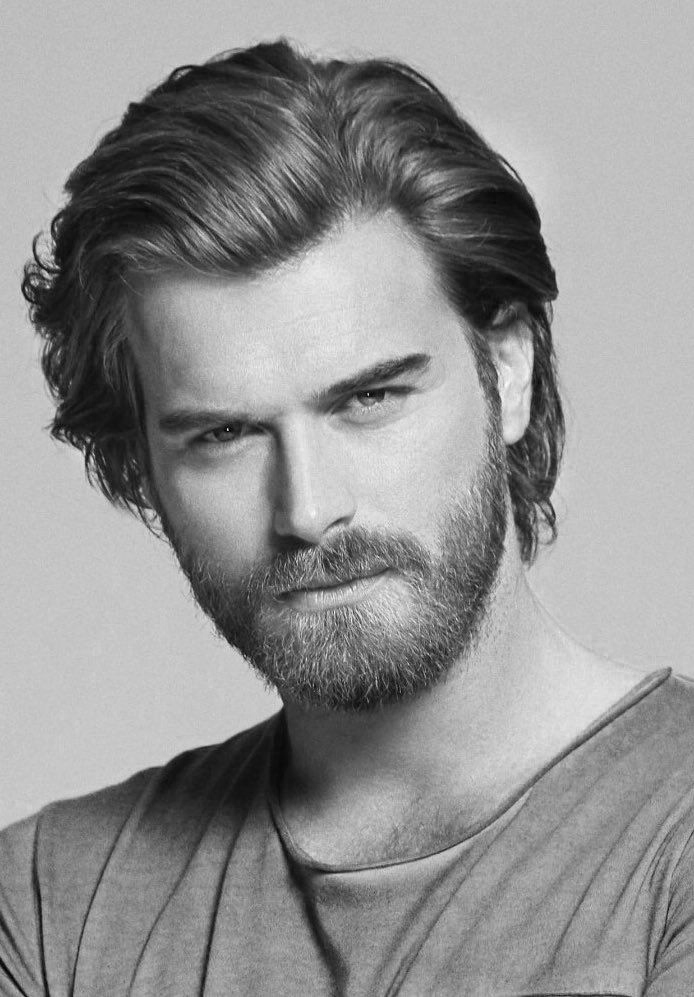

In [53]:
r

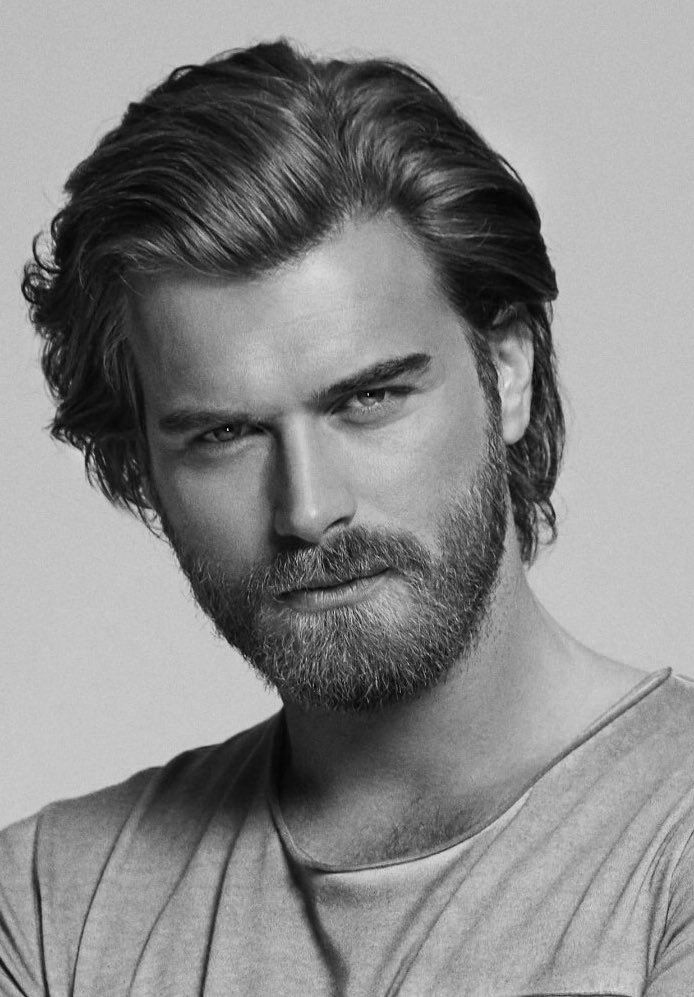

In [54]:
g

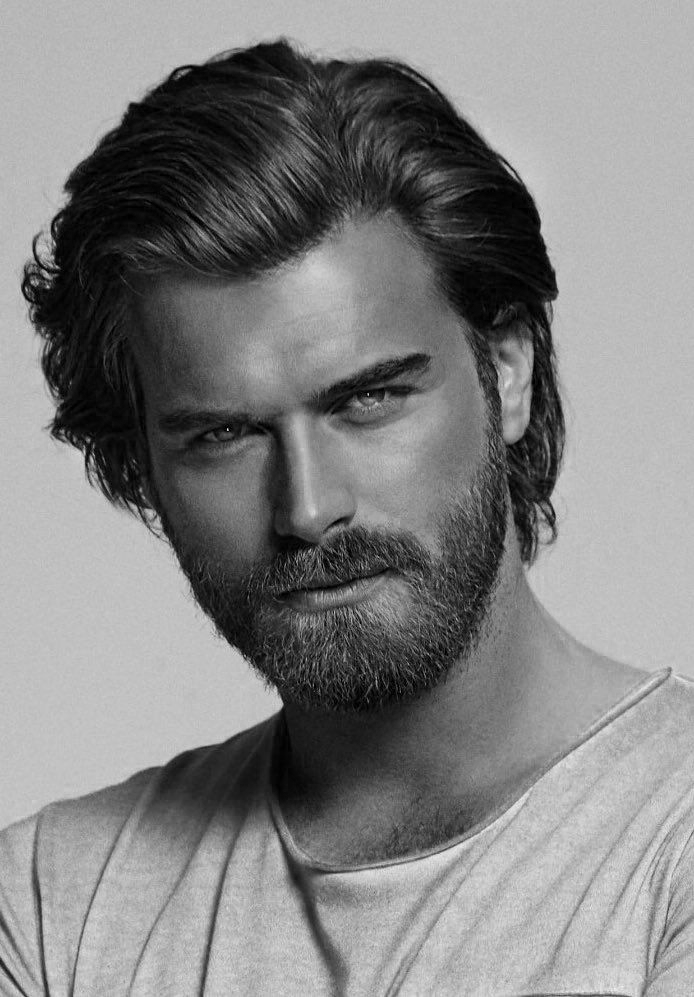

In [55]:
b

## Geometrical Transform

### simple geometry transform

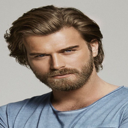

In [56]:
im.resize((128, 128))

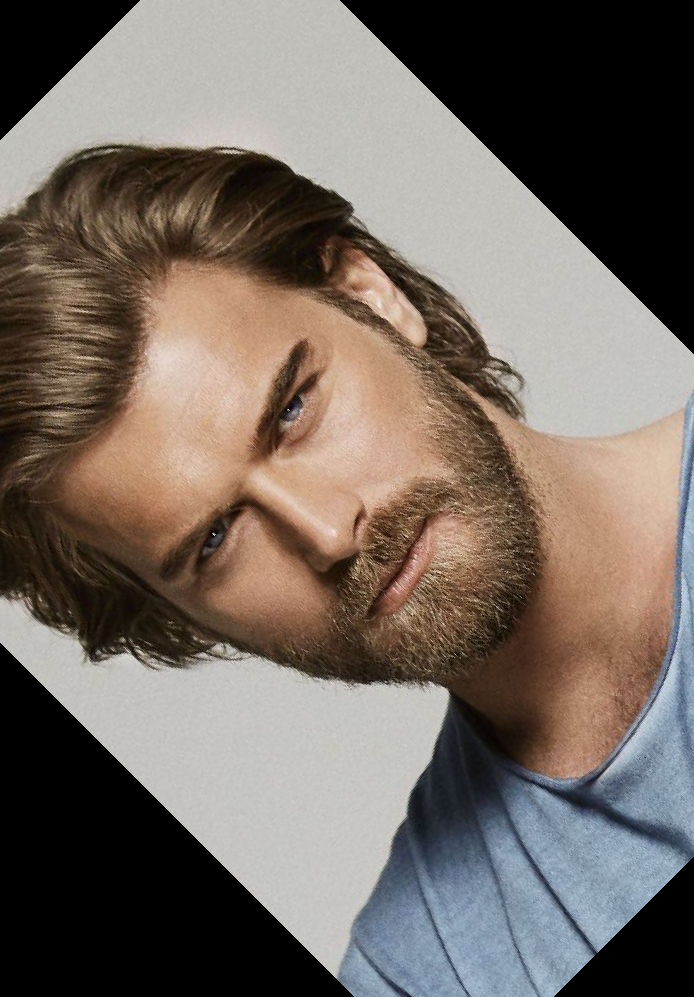

In [57]:
im.rotate(45)

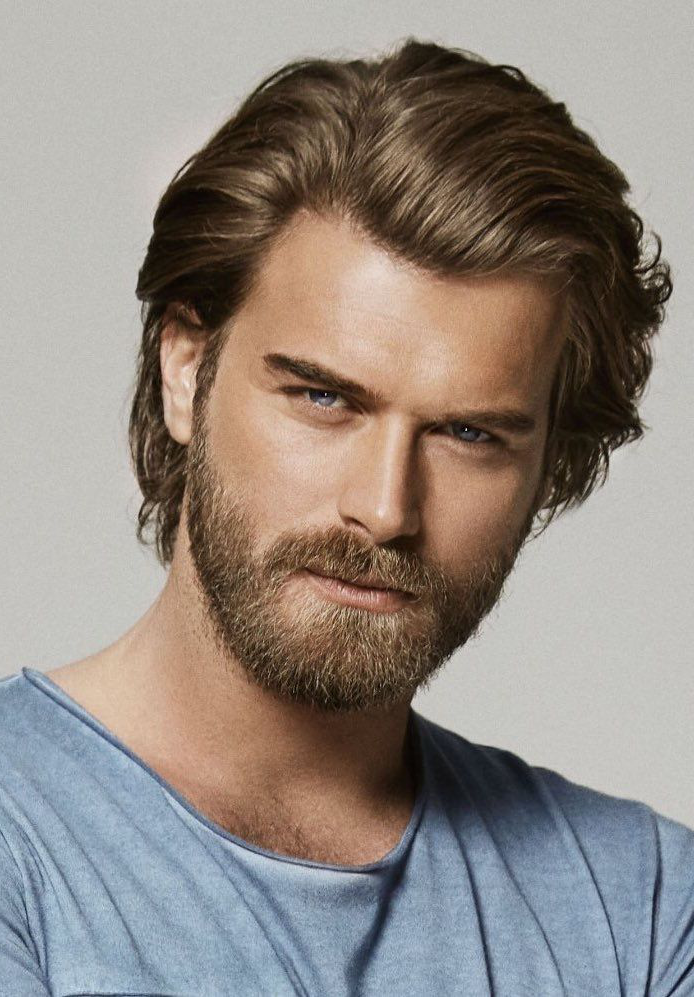

In [58]:
im.transpose(Image.FLIP_LEFT_RIGHT)

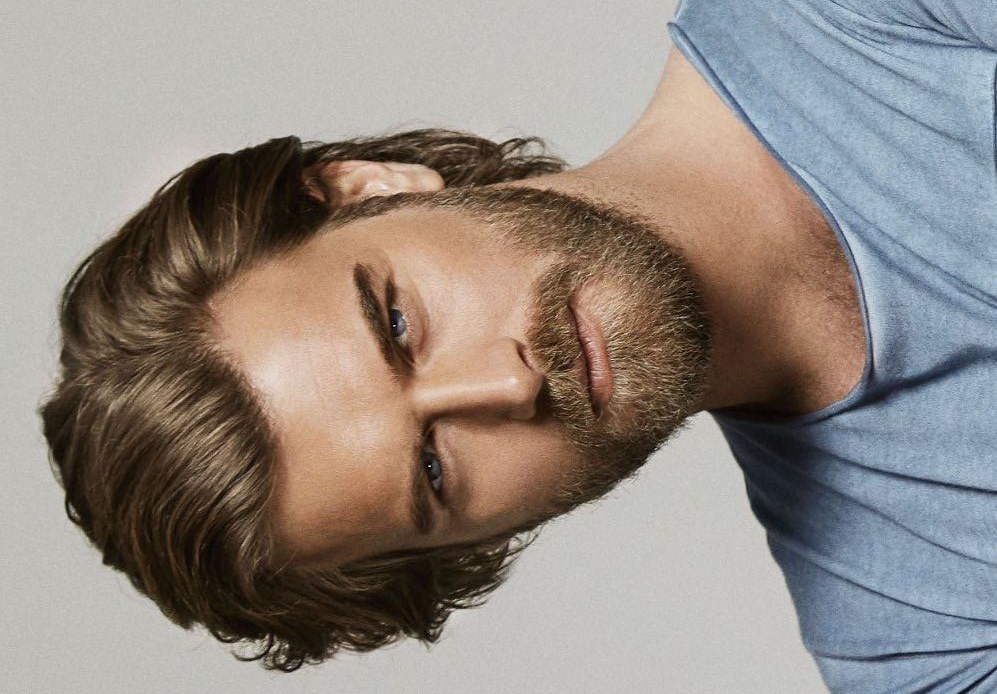

In [60]:
im.transpose(Image.ROTATE_90)

## Color Transform

### Coverting between modes

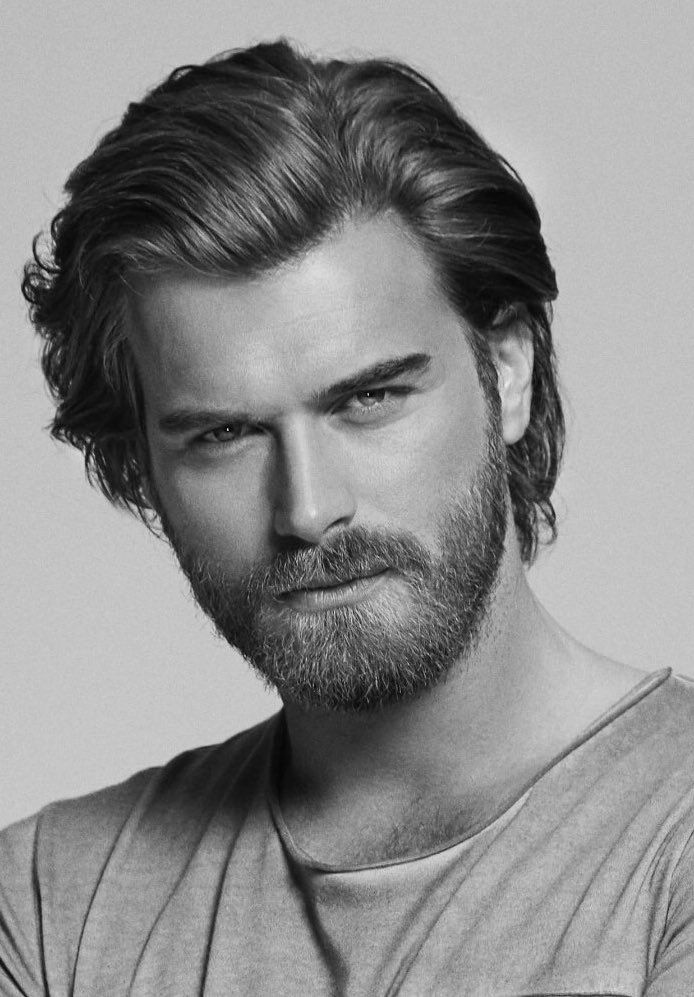

In [62]:
im.convert("L")

## Image Inhancement

### Filter

In [65]:
from PIL import ImageFilter

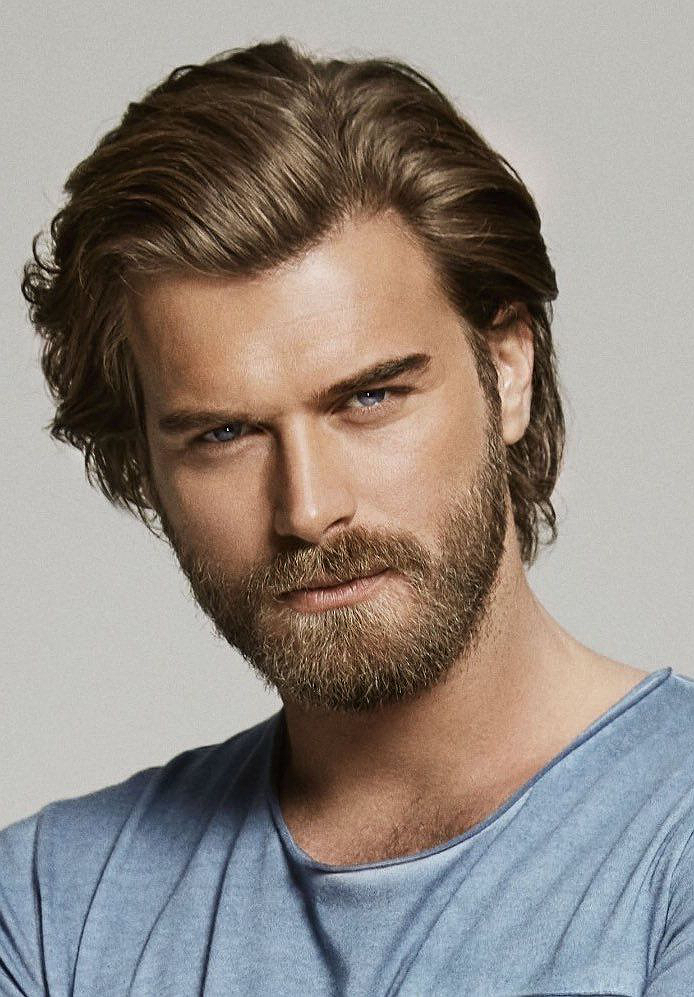

In [67]:
im.filter(ImageFilter.DETAIL)

## Point Operations

### Apply point transform

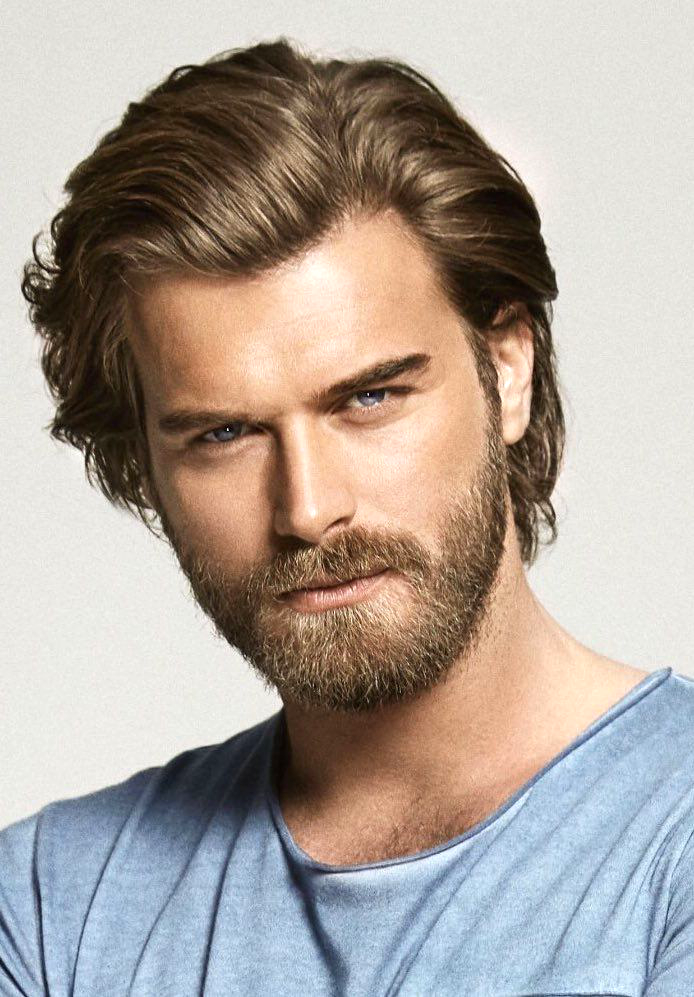

In [68]:
im.point(lambda i: i * 1.2)

### processing individual bands

In [70]:
r, g, b = im.split()

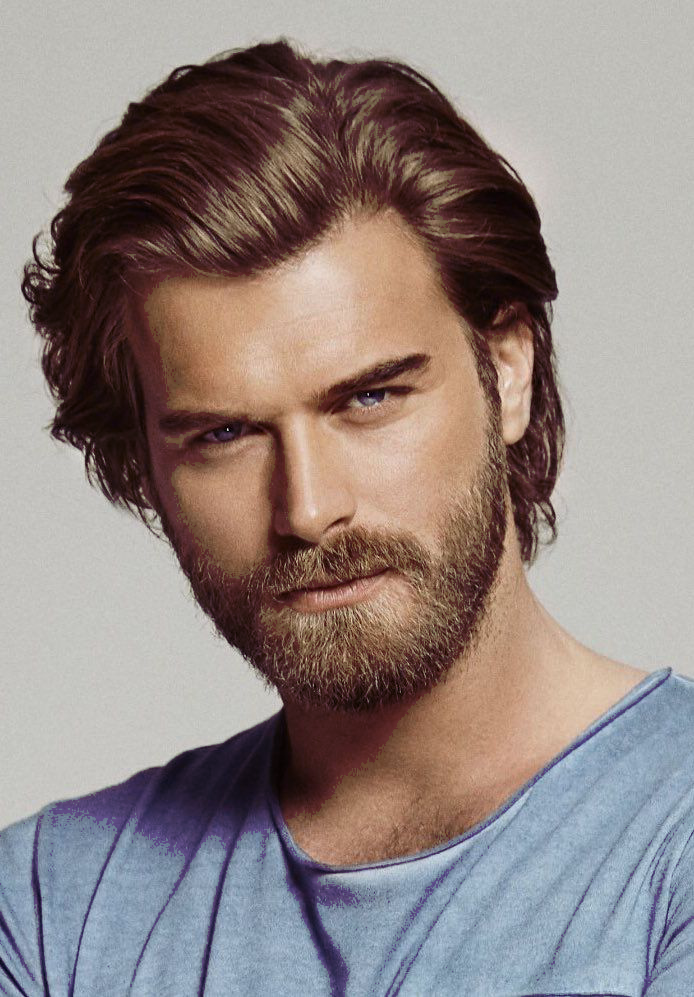

In [71]:
mask = r.point(lambda i: i < 100 and 255)
out = g.point(lambda i: i * 0.7)
g.paste(out, None, mask)
Image.merge(im.mode, [r, g, b])

## More Enhancement

In [72]:
from PIL import ImageEnhance

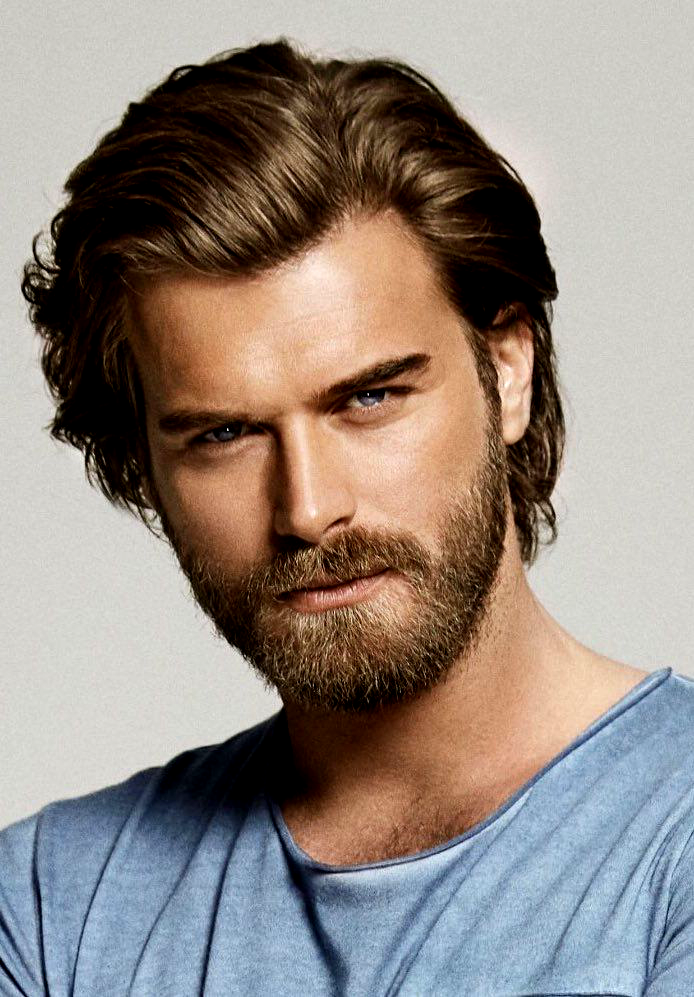

In [73]:
enh = ImageEnhance.Contrast(im)
enh.enhance(1.3)

### Using the ImageSequence Iterator class

In [75]:
from PIL import ImageSequence

In [108]:
gif = "/content/drive/MyDrive/dataSet/img/3.gif"

In [109]:
im = Image.open(gif)
# for i in range(10):
#     x = im.seek(im.tell() + i)
#     print(type(x))

<class 'NoneType'>
<class 'NoneType'>
<class 'NoneType'>
<class 'NoneType'>
<class 'NoneType'>
<class 'NoneType'>
<class 'NoneType'>
<class 'NoneType'>
<class 'NoneType'>
<class 'NoneType'>


In [83]:
f = ImageSequence.Iterator(im)

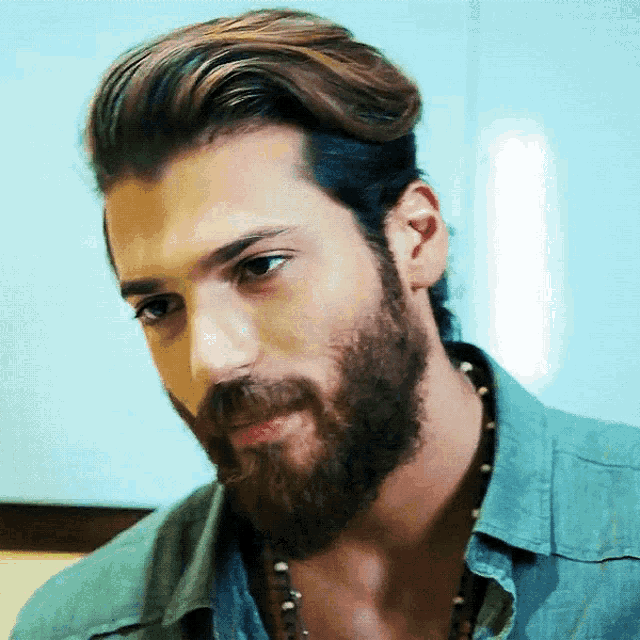

In [84]:
next(f)

## Drawing Postscript

In [90]:
from PIL import PSDraw

In [92]:
im = Image.open(im_path)

In [ ]:
box = (1*72, 2*72, 7*72, 10*72)
title = "iga"
ps = PSDraw.PSDraw()
ps.begin_document(title)
ps.image(box, im, 75)
ps.rectangle(box)
ps.setfont("HelveticaNarrow-Bold", 36)
ps.text((3*72, 4*72), title)
ps.end_document()

In [97]:
with Image.open(im_path) as im:
    title = "hopper"
    box = (1*72, 2*72, 7*72, 10*72) # in points

    ps = PSDraw.PSDraw() # default is sys.stdout
    ps.begin_document(title)

    # draw the image (75 dpi)
    ps.image(box, im, 75)
    ps.rectangle(box)

    # draw title
    ps.setfont("HelveticaNarrow-Bold", 36)
    ps.text((3*72, 4*72), title)

    ps.end_document()

%!PS-Adobe-3.0
save
/showpage { } def
%%EndComments
%%BeginDocument
/S { show } bind def
/P { moveto show } bind def
/M { moveto } bind def
/X { 0 rmoveto } bind def
/Y { 0 exch rmoveto } bind def
/E {    findfont
        dup maxlength dict begin
        {
                1 index /FID ne { def } { pop pop } ifelse
        } forall
        /Encoding exch def
        dup /FontName exch def
        currentdict end definefont pop
} bind def
/F {    findfont exch scalefont dup setfont
        [ exch /setfont cvx ] cvx bind def
} bind def
/Vm { moveto } bind def
/Va { newpath arcn stroke } bind def
/Vl { moveto lineto stroke } bind def
/Vc { newpath 0 360 arc closepath } bind def
/Vr {   exch dup 0 rlineto
        exch dup neg 0 exch rlineto
        exch neg 0 rlineto
        0 exch rlineto
        100 div setgray fill 0 setgray } bind def
/Tm matrix def
/Ve {   Tm currentmatrix pop
        translate scale newpath 0 0 .5 0 360 arc closepath
        Tm setmatrix
} bind def
/Vf { currentgray e

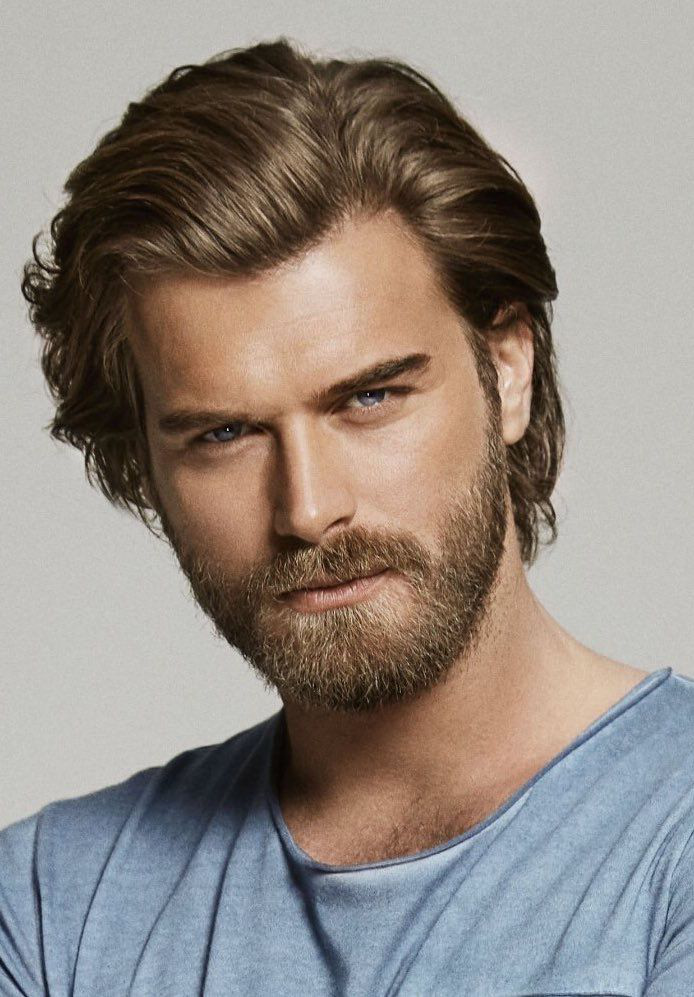

In [99]:
im

In [126]:
from PIL import ImageDraw, ImageFont

In [127]:
im = Image.open(im_path)

In [128]:
draw = ImageDraw.Draw(im)

In [132]:
# font = ImageFont.load("arial.ttf")
draw.text((10, 10), "hello", "red")


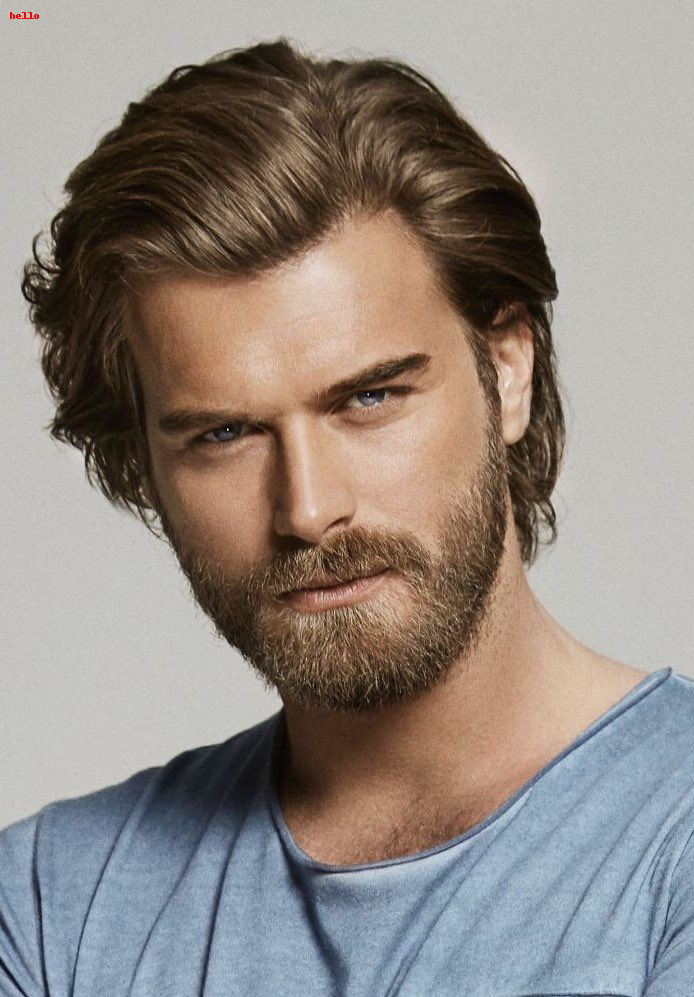

In [133]:
im

In [134]:
import PIL

In [137]:
PIL.ImageShow.show(im)

0